In [ ]:
import os
import torch
from PIL import Image
from torchvision import transforms
from SAM2.sam2.sam2.build_sam import build_sam2_video_predictor

import numpy as np
import matplotlib.pyplot as plt
points = np.array([[210, 350]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)


# 4. Initialize model
checkpoint = "checkpoints/sam2.1_hiera_base_plus.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
predictor = build_sam2_video_predictor(model_cfg, checkpoint)

# 5. Inference
with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # # Initialize with frames
    state = predictor.init_state("../segstrong/SegSTRONGC_test/test/9/0/smoke/left")
    
    # state = predictor.init_state("../test")



In [ ]:
import json
json.load(open("annotations/auto/val.json", "r"))['data/raw/SegSTRONGC_val/val/1/0/regular/left']



{'0': [{'x': 570, 'y': 458, 'label': 1},
  {'x': 420, 'y': 463, 'label': 1},
  {'x': 1119, 'y': 275, 'label': 1},
  {'x': 660, 'y': 438, 'label': 1},
  {'x': 1036, 'y': 299, 'label': 1},
  {'x': 230, 'y': 480, 'label': 1},
  {'x': 718, 'y': 347, 'label': 1},
  {'x': 768, 'y': 469, 'label': 1},
  {'x': 595, 'y': 384, 'label': 1},
  {'x': 889, 'y': 323, 'label': 1}],
 '1': [{'x': 1245, 'y': 577, 'label': 1},
  {'x': 1183, 'y': 526, 'label': 1},
  {'x': 1315, 'y': 572, 'label': 1},
  {'x': 1214, 'y': 589, 'label': 1},
  {'x': 988, 'y': 725, 'label': 1},
  {'x': 941, 'y': 646, 'label': 1},
  {'x': 1468, 'y': 473, 'label': 1},
  {'x': 1005, 'y': 622, 'label': 1},
  {'x': 1234, 'y': 622, 'label': 1},
  {'x': 940, 'y': 674, 'label': 1}]}

In [ ]:
import json
json.load(open("annotations/auto/test.json", "r"))['data/raw/SegSTRONGC_test/test/9/0/blood/left']

{'0': [{'x': 396, 'y': 777, 'label': 1},
  {'x': 376, 'y': 823, 'label': 1},
  {'x': 102, 'y': 981, 'label': 1},
  {'x': 543, 'y': 662, 'label': 1},
  {'x': 861, 'y': 594, 'label': 1},
  {'x': 93, 'y': 901, 'label': 1},
  {'x': 712, 'y': 653, 'label': 1},
  {'x': 66, 'y': 943, 'label': 1},
  {'x': 756, 'y': 653, 'label': 1},
  {'x': 703, 'y': 732, 'label': 1}],
 '1': [{'x': 1521, 'y': 867, 'label': 1},
  {'x': 1604, 'y': 839, 'label': 1},
  {'x': 1540, 'y': 859, 'label': 1},
  {'x': 1679, 'y': 943, 'label': 1},
  {'x': 1220, 'y': 697, 'label': 1},
  {'x': 1602, 'y': 841, 'label': 1},
  {'x': 1274, 'y': 784, 'label': 1},
  {'x': 1356, 'y': 777, 'label': 1},
  {'x': 1739, 'y': 861, 'label': 1},
  {'x': 1670, 'y': 1024, 'label': 1}]}

396 777
539 691
449 651
299 907
417 816
730 645
647 646
33 986
283 850
199 766
1521 867
1399 741
1233 711
1481 849
1671 865
1400 884
1266 756
1601 1004
1444 893
1367 719


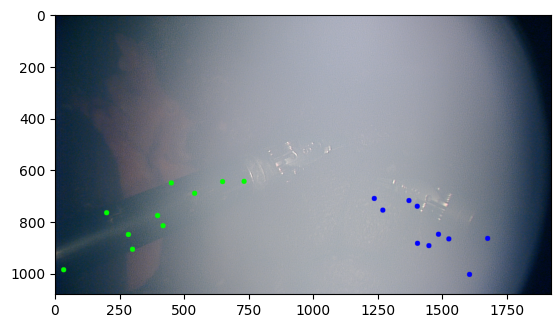

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

from json import load
points = load(open("annotations/auto/test.json", "r"))
annot = points['data/raw/SegSTRONGC_test/test/9/0/smoke/left']
annot

img = cv2.imread("../segstrong/SegSTRONGC_test/test/9/0/smoke/left/10.png")[:, :, ::-1]
img = np.ascontiguousarray(img)

for i in annot['0']:
    print(i['x'], i['y'])
    img = cv2.circle(img, (i['x'], i['y']), 10, (0, 255, 0), -1)
    
for i in annot['1']:
    print(i['x'], i['y'])
    img = cv2.circle(img, (i['x'], i['y']), 10, (0, 0, 255), -1)
    
    
plt.imshow(img)
plt.show()

/home/frozenwolf/Desktop/image-segmentation/SAM2/sam2/sam2/sam2_video_predictor.py:797: UserWarning: cannot import name '_C' from 'sam2' (/home/frozenwolf/Desktop/image-segmentation/SAM2/sam2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


State objects ids: [0]
State objects ids: [0, 1]
First frame, object_ids=[0, 1], logits min, max, mean torch.Size([2, 1, 1080, 1920]) = -18.993011474609375, 10.23982048034668, -6.9338483810424805


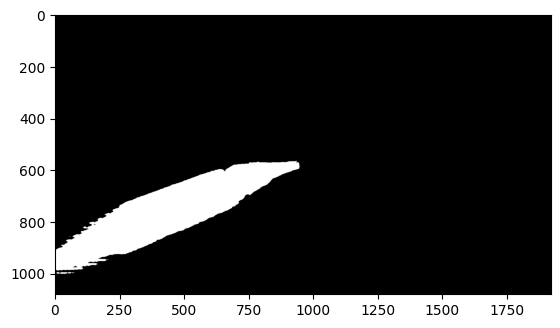

propagate in video:   0%|          | 0/300 [00:00<?, ?it/s]

Frame 0: Got masks for object_ids [0, 1]


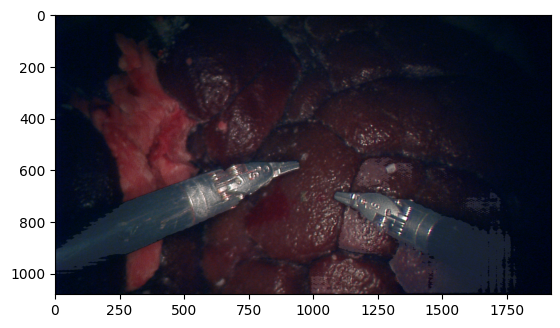

propagate in video:   0%|          | 1/300 [00:00<02:29,  2.00it/s]

Frame 1: Got masks for object_ids [0, 1]


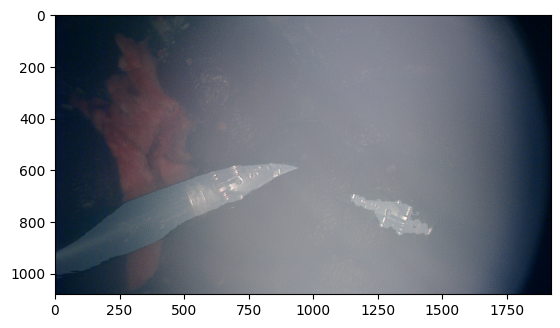

propagate in video:   1%|          | 2/300 [00:01<02:42,  1.84it/s]

Frame 2: Got masks for object_ids [0, 1]


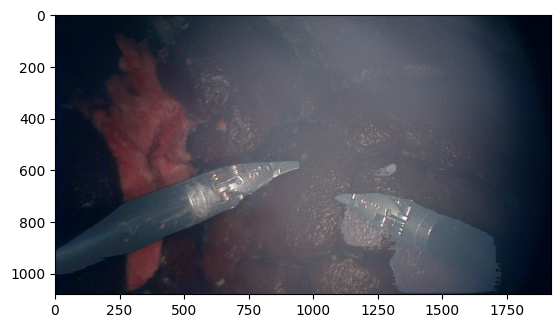

propagate in video:   1%|          | 3/300 [00:01<02:43,  1.82it/s]

Frame 3: Got masks for object_ids [0, 1]


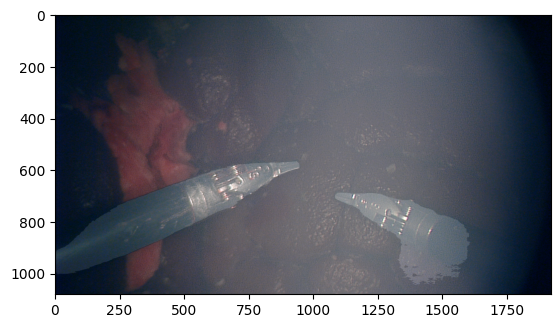

propagate in video:   1%|▏         | 4/300 [00:02<02:43,  1.81it/s]

Frame 4: Got masks for object_ids [0, 1]


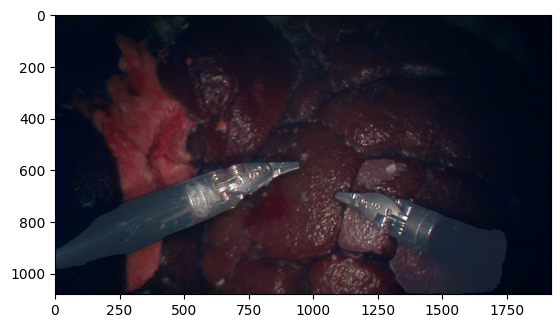

propagate in video:   2%|▏         | 5/300 [00:02<02:40,  1.83it/s]

Frame 5: Got masks for object_ids [0, 1]


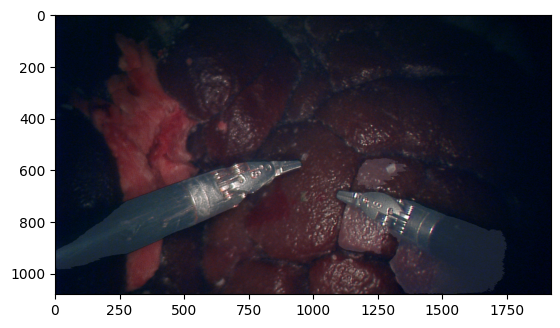

propagate in video:   2%|▏         | 6/300 [00:03<02:42,  1.81it/s]

Frame 6: Got masks for object_ids [0, 1]


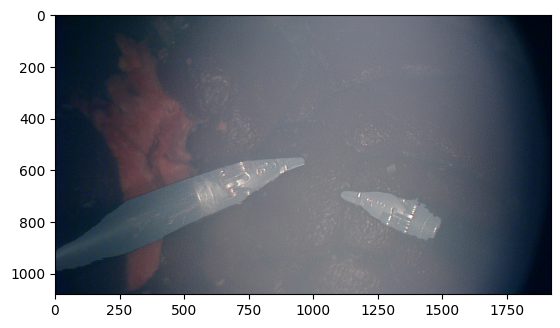

propagate in video:   2%|▏         | 7/300 [00:03<02:42,  1.80it/s]

Frame 7: Got masks for object_ids [0, 1]


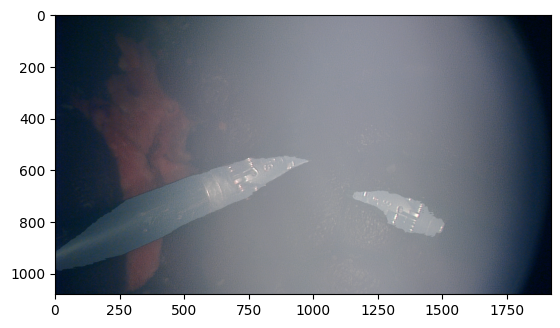

propagate in video:   3%|▎         | 8/300 [00:04<02:41,  1.81it/s]

Frame 8: Got masks for object_ids [0, 1]


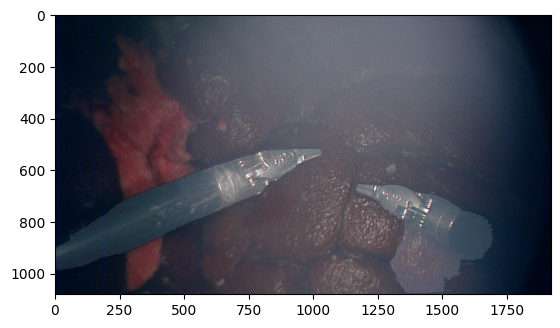

propagate in video:   3%|▎         | 9/300 [00:04<02:42,  1.79it/s]

Frame 9: Got masks for object_ids [0, 1]


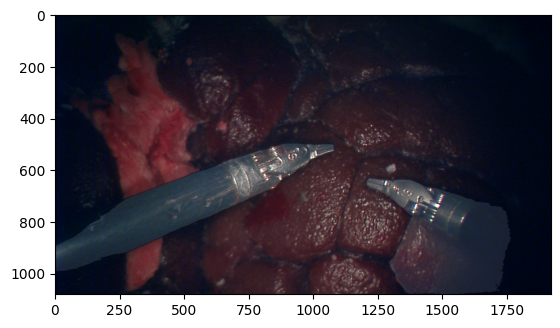

propagate in video:   3%|▎         | 10/300 [00:05<02:42,  1.78it/s]

Frame 10: Got masks for object_ids [0, 1]


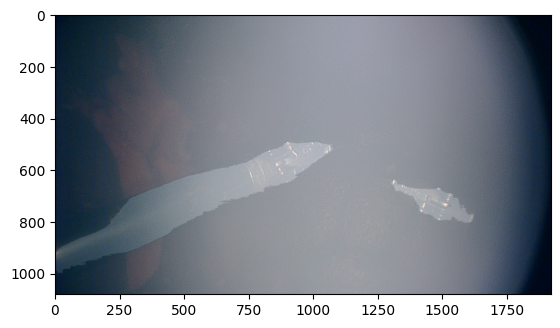

propagate in video:   3%|▎         | 10/300 [00:06<02:56,  1.65it/s]


In [ ]:

# 5. Inference
with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # Initialize with frames
    # Apply prompt only on the first frame
    for obj in annot:
        obj_point = []
        for i in annot[obj]:
            obj_point.append([i['x'], i['y']])
        obj_point = np.array(obj_point, dtype=np.float32)

        #obj_point = np.array([[200, 300], [275, 175]], dtype=np.float32)
        _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=state,
    frame_idx=0,
    obj_id=int(obj),
    points=obj_point,
    labels=np.ones(obj_point.shape[0], dtype=np.int32),
)   
        print("State objects ids:", state['obj_ids'])
    

    # Optional: print first frame results
    print(f"First frame, object_ids={out_obj_ids}, logits min, max, mean {out_mask_logits.shape} = {out_mask_logits.min()}, {out_mask_logits.max()}, {out_mask_logits.mean()}")
    plt.imshow(out_mask_logits[0][0].cpu().numpy() > 0, cmap="gray")
    plt.show()
    # Propagate masks through video
    for frame_idx, object_ids, masks in predictor.propagate_in_video(state):
        print(f"Frame {frame_idx}: Got masks for object_ids {object_ids}")

        plt.imshow(cv2.imread(f"../segstrong/SegSTRONGC_test/test/9/0/smoke/left/{frame_idx}.png")[:, :, ::-1])
        mask = (masks[0] > 0) + (masks[1] > 0)
        plt.imshow(mask[0].cpu().numpy() > 0, cmap="gray", alpha=0.1)
        plt.show()
        if frame_idx==10:
            break
        # You can save or visualize the masks here

In [ ]:
masks.shape

torch.Size([2, 1, 1080, 1920])

In [ ]:
# for i in range(2):
#     plt.imshow(masks[i][0].cpu().numpy()>0)
#     plt.show()

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

PATH = "../segstrong"
TEST_PATH = os.path.join(PATH, "SegSTRONGC_test/test/9/")
VAL_PATH = os.path.join(PATH, "SegSTRONGC_val/val/1/")

test_vids = sorted(os.listdir(TEST_PATH), key=lambda x: int(x))
val_vids = sorted(os.listdir(VAL_PATH), key=lambda x: int(x))

print(test_vids, val_vids)

set_ = []

DOMAINS = ['blood', 'bg_change', 'regular', 'smoke', 'low_brightness']

for vids in [test_vids, val_vids]:
    temp_set = {}
    for domain in DOMAINS+['ground_truth']:
        temp_set[domain] = []
        for path in vids:
            path = os.path.join(TEST_PATH, path)
            temp_path = os.path.join(path, domain)
            
            for view in ['left', 'right']:
                temp_set[domain].append([])
                for img in os.listdir(os.path.join(temp_path, view)):
                    temp_set[domain][-1].append(os.path.join(temp_path, view, img))
                    
                temp_set[domain][-1] = sorted(temp_set[domain][-1], key=lambda x: int(x.split('/')[-1].split('.')[0]))
                
    set_.append(temp_set)
    
test_set, train_set = tuple(set_)
test_gt, train_gt = test_set['ground_truth'], train_set['ground_truth']
del test_set['ground_truth'], train_set['ground_truth']
        

['0', '1', '2'] ['0', '1', '2']


In [2]:
import torch
import clip
from torchvision import transforms
from PIL import Image
import numpy as np

# ---- Config ---- #
model_name = 'ViT-B/32'
# model_name = 'ViT-L/14@336px'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ---- Load Model ---- #
model, preprocess = clip.load(model_name, device=device)
model.eval()

# ---- Function: Extract Features from Image Paths ---- #
def extract_features_from_paths(image_paths):
    images = []
    for path in image_paths:
        img = Image.open(path).convert('RGB')
        img = preprocess(img)  # CLIP has its own transform
        images.append(img)
    batch = torch.stack(images).to(device)

    with torch.no_grad():
        features = model.encode_image(batch)
        features = features / features.norm(dim=-1, keepdim=True)  # Normalize embeddings
    return features  # shape: [batch_size, feature_dim]

In [5]:
from tqdm import tqdm
test_feature = {}

for i in tqdm(test_set):
    test_feature[i] = []
    for k in tqdm(test_set[i]):
        test_feature[i].append(extract_features_from_paths(k))

# dummy

100%|██████████| 5/5 [07:18<00:00, 87.64s/it]


In [71]:
# import pickle
# pickle.dump(test_feature, open("test_feature.pkl", "wb"))
torch.save(test_feature, "test_feature.ptt")

In [6]:
    
train_feature = {}
for i in tqdm(train_set):
    train_feature[i] = []
    for k in train_set[i]:
        train_feature[i].append(extract_features_from_paths(k))
    

100%|██████████| 5/5 [07:12<00:00, 86.54s/it]


In [13]:
train_feature['blood'][0].shape

torch.Size([300, 512])

In [60]:
## average of each domain features in train:
train_anchor = {}
for i in train_feature:
    train_anchor[i] = torch.zeros((512)).cuda()
    for k in train_feature[i]:
        train_anchor[i]+=k.sum(dim=0)/len(k)
        
    train_anchor[i] = train_anchor[i]/len(train_feature[i])
    


In [62]:
test_avg = {}   
for i in test_feature:
    test_avg[i] = {}
    for idx, k in enumerate(test_feature[i]):
        test_avg[i]['/'.join(test_set[i][idx][0].split('/')[:-1])] = (k.sum(0)/len(k))
        
train_avg = {}
for i in train_feature:
    train_avg[i] = {}
    for idx, k in enumerate(train_feature[i]):
        train_avg[i]['/'.join(train_set[i][idx][0].split('/')[:-1])] = (k.sum(0)/len(k))

In [70]:
torch.save(train_feature, "train_feature.ptt")
torch.save(train_anchor, "train_anchor.ptt")
torch.save(test_avg, "test_avg.ptt")
torch.save(train_avg, "train_avg.ptt")


In [45]:
test_avg['blood']['../segstrong/SegSTRONGC_test/test/9/0/blood/left'].shape

torch.Size([512])

In [52]:
train_avg['blood'].shape

torch.Size([512])

In [ ]:
curr_availble_domains = DOMAINS[:]
embed = [train_avg[i] for i in curr_availble_domains]
vid_embed = test_avg['blood']['../segstrong/SegSTRONGC_test/test/9/0/blood/left']

embed_dist = []
for i in range(len(embed)):
    embed_dist.append((embed[i]-vid_embed).norm().item())
    
closest_domain = curr_availble_domains[embed_dist.index(min(embed_dist))]
closest_domain

'regular'

In [ ]:
import torch
import timm
from torchvision import transforms
from PIL import Image

# ---- Config ---- #
model_name = 'vit_base_patch16_224'
device = 'cuda' if torch.cuda.is_available() else 'cpu'
sam2_predictor
# ---- Preprocessing ---- #
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=(0.5, 0.5, 0.5),
        std=(0.5, 0.5, 0.5)
    )
])

# ---- Load Model ---- #
model = timm.create_model(model_name, pretrained=True, num_classes=0)  # feature extractor mode
model.to(device)
model.eval()

# ---- Function: Extract Features from Image Paths ---- #
def extract_features_from_paths(image_paths):
    images = []
    for path in image_paths:
        img = Image.open(path).convert('RGB')
        img = transform(img)
        images.append(img)
    batch = torch.stack(images).to(device)

    with torch.no_grad():
        features = model(batch)
    return features  # shape: [batch_size, feature_dim]

# ---- Example Usage ---- #
image_paths = [
    '/path/to/image1.jpg',
    '/path/to/image2.png',
    '/path/to/image3.jpeg',
]

from tqdm.auto import tqdm
features_ = {}
for domain in tqdm(dummy):
    features = extract_features_from_paths(dummy[domain])
    features_[domain] = features.cpu().numpy()


  0%|          | 0/5 [00:00<?, ?it/s]

In [3]:
import torch
import clip
from torchvision import transforms
from PIL import Image
import numpy as np

# ---- Config ---- #
model_name = 'ViT-B/32'
# model_name = 'ViT-L/14@336px'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ---- Load Model ---- #
model, preprocess = clip.load(model_name, device=device)
model.eval()

# ---- Function: Extract Features from Image Paths ---- #
def extract_features_from_paths(image_paths):
    images = []
    for path in image_paths:
        img = Image.open(path).convert('RGB')
        img = preprocess(img)  # CLIP has its own transform
        images.append(img)
    batch = torch.stack(images).to(device)

    with torch.no_grad():
        features = model.encode_image(batch)
        features = features / features.norm(dim=-1, keepdim=True)  # Normalize embeddings
    return features  # shape: [batch_size, feature_dim]

# ---- Example Usage ---- #
image_paths = [
    '/path/to/image1.jpg',
    '/path/to/image2.png',
    '/path/to/image3.jpeg',
]

from tqdm.auto import tqdm


features_ = {}
for domain in tqdm(dummy):
    features = extract_features_from_paths(dummy[domain])
    features_[domain] = features.cpu().numpy()


  0%|          | 0/5 [00:00<?, ?it/s]

In [5]:
import torch
from torchvision import transforms
from torchvision.models.vision_transformer import vit_b_32, ViT_B_32_Weights
from PIL import Image
import numpy as np

# ---- Config ---- #
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ---- Load Model + Preprocessing ---- #
weights = ViT_B_32_Weights.IMAGENET1K_V1  # DINOv2 weights
model = vit_b_32(weights=weights)
model.to(device)
model.eval()

# Remove classification head for feature extraction
model.heads = torch.nn.Identity()

transform = weights.transforms()

# ---- Function: Extract Features from Image Paths ---- #
def extract_features_from_paths(image_paths):
    images = []
    for path in image_paths:
        img = Image.open(path).convert('RGB')
        img = transform(img)
        images.append(img)
    batch = torch.stack(images).to(device)

    with torch.no_grad():
        features = model(batch)
        features = features / features.norm(dim=-1, keepdim=True)  # Normalize
    return features  # shape: [batch_size, feature_dim]

# ---- Example Usage ---- #
image_paths = [
    '/path/to/image1.jpg',
    '/path/to/image2.png',
    '/path/to/image3.jpeg',
]

from tqdm.auto import tqdm

# # Dummy structure for example (replace with actual dictionary of domain → list of paths)
# dummy = {
#     'blurry': image_paths,
#     'dark': image_paths,
#     'smoky': image_paths,
#     'normal': image_paths
# }

features_ = {}
for domain in tqdm(dummy):
    features = extract_features_from_paths(dummy[domain])
    features_[domain] = features.cpu().numpy()


Downloading: "https://download.pytorch.org/models/vit_b_32-d86f8d99.pth" to /home/frozenwolf/.cache/torch/hub/checkpoints/vit_b_32-d86f8d99.pth
100%|██████████| 337M/337M [00:21<00:00, 16.6MB/s] 


  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
ViT_B_32_Weights.IMAGENET1K_V1

<enum 'ViT_B_32_Weights'>

Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/0.png -> Original Predicted Cluster: 4, Remapped Predicted Label: 0
Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/25.png -> Original Predicted Cluster: 4, Remapped Predicted Label: 0
Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/50.png -> Original Predicted Cluster: 4, Remapped Predicted Label: 0
Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/75.png -> Original Predicted Cluster: 4, Remapped Predicted Label: 0
Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/100.png -> Original Predicted Cluster: 4, Remapped Predicted Label: 0
Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/125.png -> Original Predicted Cluster: 4, Remapped Predicted Label: 0
Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/150.png -> Original Predicted Cluster: 4, Remapped Predicted Label: 0
Image: ../segstrong/SegSTRONGC_test/test/9/0/blood/left/175.png -> Original Predicted Cluster: 4, Remapped Predicted Label:

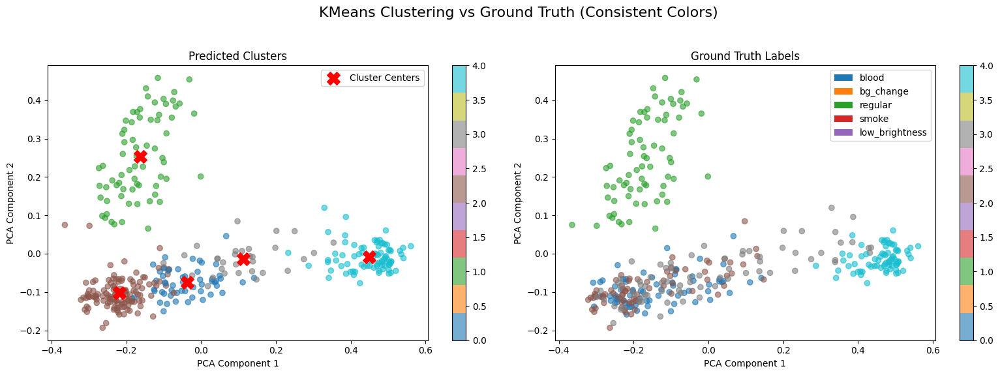

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment
import torch

# ---- Function: Apply KMeans Clustering ---- #
def apply_kmeans(features, n_clusters=3):
    # Convert torch tensor to numpy array if necessary
    features_np = features.cpu().numpy() if torch.is_tensor(features) else features
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(features_np)
    return kmeans.labels_, kmeans.cluster_centers_

# ---- Helper Function: Compute Optimal Label Mapping Using the Hungarian Algorithm ---- #
def compute_label_mapping(true_labels, pred_labels):
    """
    Computes a mapping from predicted cluster labels to ground-truth labels
    using the Hungarian algorithm.
    Returns a dictionary: {predicted_label: mapped_true_label, ...}
    """
    true_labels = np.array(true_labels)
    pred_labels = np.array(pred_labels)
    labels = np.unique(true_labels)
    clusters = np.unique(pred_labels)
    n_labels, n_clusters = len(labels), len(clusters)
    
    # Build cost matrix: cost[i, j] is negative count of samples with true label `labels[i]`
    # in predicted cluster `clusters[j]`.
    cost_matrix = np.zeros((n_labels, n_clusters), dtype=int)
    for i, label in enumerate(labels):
        for j, cluster in enumerate(clusters):
            cost_matrix[i, j] = -np.sum((true_labels == label) & (pred_labels == cluster))
    
    # Solve the assignment problem.
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    
    # Mapping: predicted cluster (col) -> true label (row)
    mapping = {clusters[j]: labels[i] for i, j in zip(row_ind, col_ind)}
    return mapping

# ---- Function: Remap predicted labels to align with ground truth ---- #
def remap_predicted_labels(pred_labels, mapping):
    return np.array([mapping[label] for label in pred_labels])

# ---- Function: Plot Predicted Clusters and Ground Truth Side by Side ---- #
def plot_side_by_side(features, pred_labels, true_labels, centers, label_mapping, title="KMeans Clustering vs Ground Truth"):
    """
    Parameters:
      features: Feature array (N x feature_dim)
      pred_labels: Predicted cluster labels (already remapped to match true labels)
      true_labels: Ground truth numeric labels
      centers: Cluster centers from KMeans
      label_mapping: dict mapping numeric ground truth label -> domain name
    """
    # Convert to numpy if needed
    X = features.cpu().numpy() if torch.is_tensor(features) else features
    centers = np.array(centers)
    
    # Reduce features and centers to 2D using PCA
    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)
    centers_reduced = pca.transform(centers)
    
    # Use the same colormap for both plots; here we use 'tab10'
    cmap = plt.get_cmap('tab10')
    
    # Create subplots for predicted clusters and ground truth
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # --- Predicted Clusters Plot ---
    scatter_pred = axes[0].scatter(X_reduced[:, 0], X_reduced[:, 1], c=pred_labels, cmap=cmap, alpha=0.6)
    axes[0].scatter(centers_reduced[:, 0], centers_reduced[:, 1], c='red', marker='X', s=200, label='Cluster Centers')
    axes[0].set_title("Predicted Clusters")
    axes[0].set_xlabel("PCA Component 1")
    axes[0].set_ylabel("PCA Component 2")
    axes[0].legend()
    plt.colorbar(scatter_pred, ax=axes[0])
    
    # --- Ground Truth Plot ---
    scatter_true = axes[1].scatter(X_reduced[:, 0], X_reduced[:, 1], c=true_labels, cmap=cmap, alpha=0.6)
    axes[1].set_title("Ground Truth Labels")
    axes[1].set_xlabel("PCA Component 1")
    axes[1].set_ylabel("PCA Component 2")
    
    # Create custom legend handles for ground truth using label_mapping (numeric -> domain name)
    unique_labels = np.unique(true_labels)
    legend_handles = []
    for label in unique_labels:
        color = cmap(label % 10)  # Use modulo to index into tab10 if more than 10 labels.
        legend_handles.append(Patch(facecolor=color, label=label_mapping[label]))
    axes[1].legend(handles=legend_handles)
    plt.colorbar(scatter_true, ax=axes[1])
    
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# ---- Data Aggregation ---- #
# Assume:
# - 'dummy' is a dictionary mapping domain names (ground-truth labels) to lists of image paths.
# - 'features_' is a dictionary mapping the same domain names to their corresponding feature arrays.
total_features = []
total_imgs = []
true_labels = []

# Mapping from domain name to numeric label.
domain_to_label = {domain: idx for idx, domain in enumerate(dummy.keys())}
# Reverse mapping for legend: numeric label -> domain name.
label_to_domain = {v: k for k, v in domain_to_label.items()}

for domain, img_list in dummy.items():
    total_features.append(features_[domain])  # features_[domain] should be an array of shape [num_images, feature_dim]
    total_imgs += img_list
    true_labels += [domain_to_label[domain]] * len(img_list)

# Concatenate features from all domains.
total_features = np.concatenate(total_features, axis=0)

# ---- Clustering ---- #
n_clusters = len(dummy)  # Use the number of unique domains as the number of clusters
pred_labels, centers = apply_kmeans(total_features, n_clusters)

# Compute the mapping from predicted labels to true labels.
label_map = compute_label_mapping(true_labels, pred_labels)
remapped_pred_labels = remap_predicted_labels(pred_labels, label_map)

# Output clustering assignments for inspection.
for idx, (img, pred, remap_pred) in enumerate(zip(total_imgs, pred_labels, remapped_pred_labels)):
    print(f"Image: {img} -> Original Predicted Cluster: {pred}, Remapped Predicted Label: {remap_pred}")

print("Cluster centers shape:", np.array(centers).shape)

# ---- Evaluation Metrics ---- #
# (Evaluation metrics are computed using the original predicted labels. You may recompute
#  them using remapped_pred_labels if you want them aligned with the ground truth.)
from sklearn.metrics import accuracy_score
def clustering_accuracy(true_labels, predicted_labels):
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)
    return accuracy_score(true_labels, predicted_labels)

acc = clustering_accuracy(true_labels, remapped_pred_labels)
print(f"Clustering Accuracy (after mapping): {acc * 100:.2f}%")

nmi = normalized_mutual_info_score(true_labels, remapped_pred_labels)
print(f"Normalized Mutual Information (NMI): {nmi:.4f}")

# ---- Plot Side-by-Side Comparison with Consistent Colors ---- #
plot_side_by_side(total_features, remapped_pred_labels, true_labels, centers, label_mapping=label_to_domain,
                  title="KMeans Clustering vs Ground Truth (Consistent Colors)")


In [ ]:
total_features.shape

(60, 768)

In [ ]:
import cv2
from PIL import Image as PILImage
from iopath.common.file_io import g_pathmgr

with g_pathmgr.open(test_set['blood'][0][0], "rb") as fopen:
    img = PILImage.open(fopen).convert("RGB")
    
## convert mask to black and white
mask = cv2.imread(test_gt[0][0], 0)
# mask = np.where(mask > 0, 255, 0).astype(np.uint8)
objects = cv2.connectedComponents(mask)

In [ ]:
# Copyright (c) Meta Platforms, Inc. and affiliates.
# All rights reserved.

# This source code is licensed under the license found in the
# LICENSE file in the root directory of this source tree.

import logging
import random
from copy import deepcopy
from tqdm.auto import tqdm
import numpy as np

import torch
from iopath.common.file_io import g_pathmgr
from PIL import Image as PILImage
from torchvision.datasets.vision import VisionDataset
from SAM2.sam2.training.utils.data_utils import Frame, Object, VideoDatapoint


class VOSDataset(VisionDataset):
    def __init__(
        self,
        transforms,
        videos,
        gt_frames,
    ):
        self.vidoes = videos
        self.gt_frames = gt_frames
        self._transforms = transforms
        self.cache_gt = {}

    def _get_datapoint(self, idx):
        # start_frame = np.random.randint(0, len(self.video_dataset[idx]) - 10)
        # end_frame = np.random.randint(start_frame + 5, len(self.video_dataset[idx]))
        start_frame, end_frame = 0, 3 #len(self.vidoes[idx])-1
        video = self.vidoes[idx][start_frame:end_frame]
        gt_frames = self.gt_frames[idx][start_frame:end_frame]
        frame_num_list = list(range(start_frame, end_frame))
        
        images = []
        frame_idx = 0
        rgb_images = load_images(video)
        
        have_sampled = False
        prev_connected_comp = None
        for gt_mask, frame_num in tqdm(zip(gt_frames, frame_num_list)):
            w, h = rgb_images[frame_num].size
            images.append(
                Frame(
                    data=rgb_images[frame_num],
                    objects=[],
                )
            )
            
            if f"{gt_mask}_{frame_num}" in self.cache_gt:
                objects = self.cache_gt[f"{gt_mask}_{frame_num}"]
            else:
                mask = cv2.imread(gt_mask, 0)
                objects = cv2.connectedComponents(mask)
                self.cache_gt[f"{gt_mask}_{frame_num}"] = deepcopy(objects)
                
            #     print("mask")
            #     plt.imshow(mask)
            #     plt.show()
                
            # print("init")
            # plt.imshow(objects[1])
            # plt.show()
            objects = objects[1]
            class_, class_count = np.unique(objects, return_counts=True)
            bg_class = class_[np.where(class_count == np.max(class_count))[0][0]]
            class_ = class_.tolist()
            
            if bg_class!=0:
                objects+=1
                objects[objects==0] = 5
                objects[objects==bg_class] = 0
                objects[objects==5] = bg_class
                bg_class = 0
                
            class_.remove(bg_class)
            
            
            if not have_sampled:
                # sample = np.random.choice(2)+1 # 1 or 2
                sample = 2
                sampled_objs = np.random.choice(class_, sample, replace=False)
                have_sampled = True
            else:
                ### calc iou and make sure obj id doesnt change due to connected comp random label allocation
                
                prev_connected_comp_temp = deepcopy(prev_connected_comp)
                objects_temp = deepcopy(objects)
                prev_connected_comp[prev_connected_comp!=1] = 0
                objects[objects!=1] = 0
                iou1 = np.logical_and(prev_connected_comp, objects)
        
                prev_connected_comp = deepcopy(prev_connected_comp_temp)
                objects = deepcopy(objects_temp)
                
                prev_connected_comp[prev_connected_comp==1] = 3
                prev_connected_comp[prev_connected_comp==2] = 1
                prev_connected_comp[prev_connected_comp==3] = 2
                prev_connected_comp[prev_connected_comp!=1] = 0
                objects[objects!=1] = 0
                
                iou2 = np.logical_and(prev_connected_comp, objects)
                objects = deepcopy(objects_temp)
                
                if iou2.sum() > iou1.sum():
                    print("swapped!!")
                    objects[objects==1] = 3
                    objects[objects==2] = 1
                    objects[objects==3] = 2
                    
                    
            prev_connected_comp = objects
            # print("final")
            # plt.imshow(objects)
            # plt.show()
            
            for objs in sampled_objs:
                mask = np.where(objects == objs, 1, 0).astype(np.uint8)
                images[frame_idx].objects.append(
                    Object(
                        object_id=objs-1,
                        frame_index=frame_num,
                        segment= torch.Tensor(mask),
                    )
                )
            
            frame_idx += 1

            
        datapoint = VideoDatapoint(
            frames=images,
            video_id=idx,
            size=(h, w),
        )

        datapoint = self._transforms(datapoint)
        return datapoint

    def __getitem__(self, idx):
        return self._get_datapoint(idx)

    def __len__(self):
        return len(self.vidoes)


def load_images(frames):
    all_images = []
    for path in tqdm(frames):
        with g_pathmgr.open(path, "rb") as fopen:
            all_images.append(PILImage.open(fopen).convert("RGB"))

    return all_images





from SAM2.sam2.training.dataset.transforms import (
    ComposeAPI,
    RandomHorizontalFlip,
    RandomAffine,
    RandomResizeAPI,
    ColorJitter,
    RandomGrayscale,
    ToTensorAPI,
    NormalizeAPI
)


train_transform = ComposeAPI([
    RandomHorizontalFlip(consistent_transform=True),
    # RandomAffine(
    #     degrees=25,
    #     shear=20,
    #     image_interpolation="bilinear",
    #     consistent_transform=True,
    # ),
    # ColorJitter(
    #     consistent_transform=True,
    #     brightness=0.1,
    #     contrast=0.03,
    #     saturation=0.03,
    #     hue=None,
    # ),
    # RandomGrayscale(
    #     consistent_transform=True,
    #     p=1,
    # ),
    RandomResizeAPI(
        sizes=1024,
        square=True,
        consistent_transform=True,
    ),
    # ColorJitter(
    #     consistent_transform=False,
    #     brightness=0.1,
    #     contrast=0.05,
    #     saturation=0.05,
    #     hue=None,
    # ),
    ToTensorAPI(),
    NormalizeAPI(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])


dataset = VOSDataset(transforms=train_transform, 
                     videos=test_set['regular'], 
                     gt_frames=test_gt)

a = next(iter(dataset))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


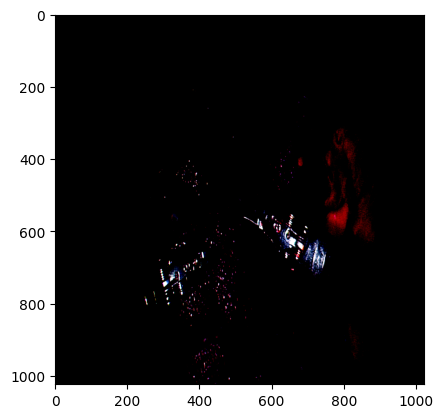

In [ ]:
a.frames[0].data ## 3, 1024, 1024
a = a.frames[0].data.permute(1, 2, 0).cpu().numpy()
plt.imshow(a)

In [ ]:

from SAM2.sam2.training.model.sam2 import SAM2Train
import importlib
import SAM2.sam2.training.utils.data_utils
importlib.reload(SAM2.sam2.training.model.sam2)
from SAM2.sam2.training.model.sam2 import SAM2Train
from sam2_model import get_model

In [ ]:
from sam2_dataset import get_dataloader
from lora_qkv import wrap_decoder_lora, wrap_image_encoder_lora
from omegaconf import OmegaConf

config = OmegaConf.load("config.yaml")
config.distributed = False
from sam2_model import _load_checkpoint


model = get_model(config)
_load_checkpoint(model, config.model.checkpoint)

wrap_decoder_lora(model, 8)
wrap_image_encoder_lora(model, 8)

model = model.to("cuda")

config.dataset.path = "../segstrong"
train_loader, val_loader = get_dataloader("regular", config)

batch = next(iter(train_loader))
batch = batch.to(
                "cuda"
            ) 

import torch
model.training = True
with torch.no_grad():
    output = model(batch)
targets = batch.masks

from SAM2.sam2.training.loss_fns import MultiStepMultiMasksAndIous
weight_dict = {'loss_mask': 20,
                'loss_dice': 1,
                'loss_iou': 1,
                'loss_class': 1}

criterion = MultiStepMultiMasksAndIous(weight_dict=weight_dict)
loss = criterion(output, targets)

['0', '1', '2'] ['0', '1', '2']


In [ ]:
features = model.image_encoder.trunk.get_embedding(batch.flat_img_batch)

In [ ]:
batch.flat_img_batch.shape

torch.Size([8, 3, 1024, 1024])

In [ ]:
[i.shape for i in features]

[torch.Size([8, 112, 256, 256]),
 torch.Size([8, 224, 128, 128]),
 torch.Size([8, 448, 64, 64]),
 torch.Size([8, 896, 32, 32])]

In [ ]:
896*32*32

917504

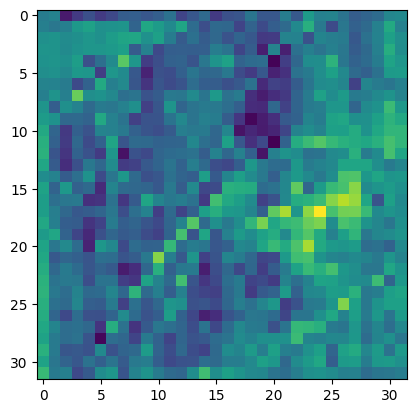

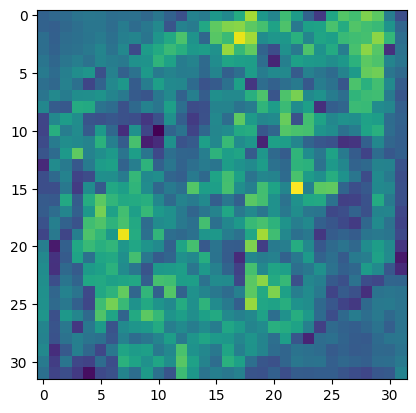

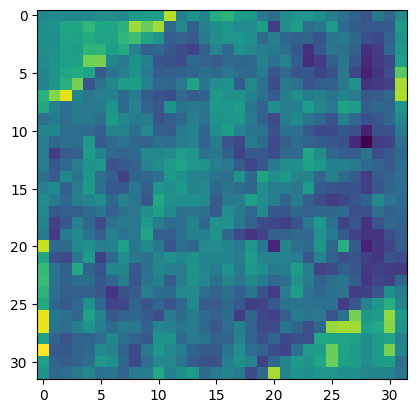

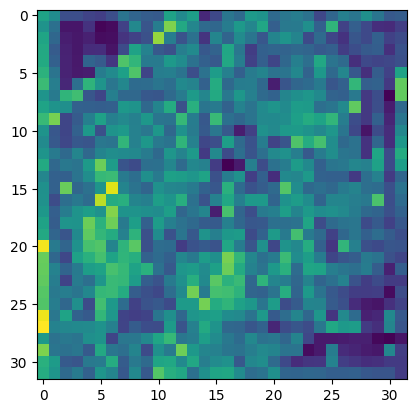

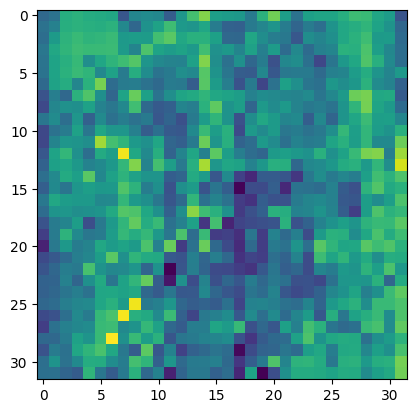

...

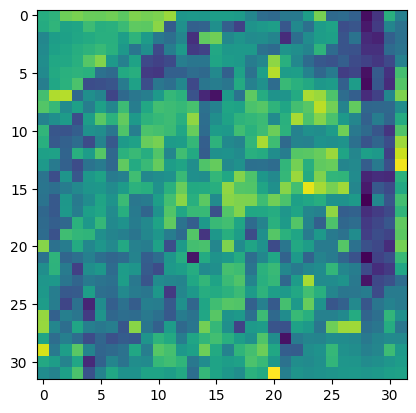

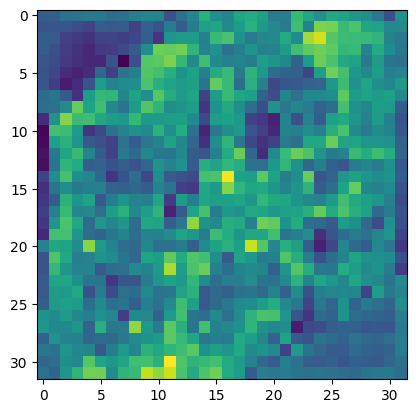

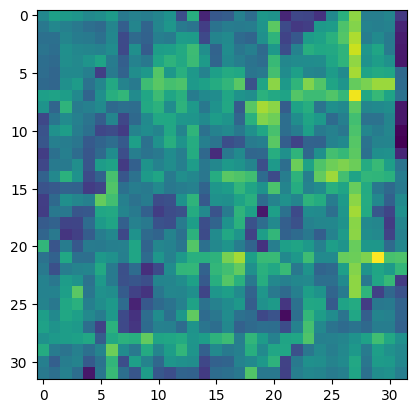

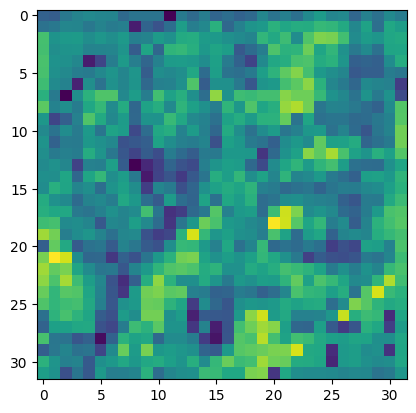

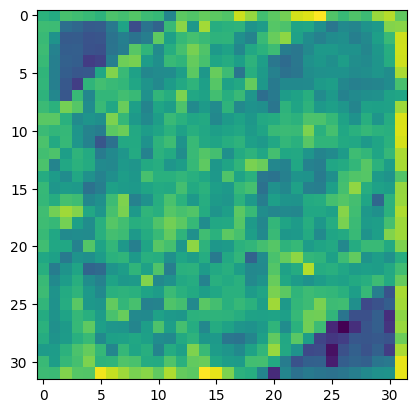

KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
for i in range(len(features[-1][0])):
    plt.imshow(features[-1][0][i].cpu().numpy())
    plt.show()

In [ ]:
448*64*64

1835008

In [ ]:
for k in [ 'multistep_pred_masks', 'multistep_pred_masks_high_res', 'multistep_pred_multimasks', 'multistep_pred_multimasks_high_res', 'multistep_pred_ious', 'multistep_point_inputs', 'multistep_object_score_logits', 'pred_masks', 'pred_masks_high_res']:
    if type(output[1][k])==list:
        if output[1][k][0] == None:
            print(k, output[1][k])
            continue
        print(k, [i.shape for i in output[1][k]])
    else:
        print(k, output[1][k].shape)

multistep_pred_masks torch.Size([4, 1, 256, 256])
multistep_pred_masks_high_res torch.Size([4, 1, 1024, 1024])
multistep_pred_multimasks [torch.Size([4, 3, 256, 256])]
multistep_pred_multimasks_high_res [torch.Size([4, 3, 1024, 1024])]
multistep_pred_ious [torch.Size([4, 3])]
multistep_point_inputs [None]
multistep_object_score_logits [torch.Size([4, 1])]
pred_masks torch.Size([4, 1, 256, 256])
pred_masks_high_res torch.Size([4, 1, 1024, 1024])


In [ ]:
torch.unsqueeze(output[0]['multistep_pred_masks_high_res'].squeeze(), 0).shape

torch.Size([1, 4, 1024, 1024])

In [ ]:
batch.masks.shape, 

torch.Size([4, 4, 1024, 1024])

In [ ]:
torch.stack([output[i]['multistep_pred_masks_high_res'].squeeze() for i in range(len(output))], 0)

torch.Size([4, 4, 1024, 1024])

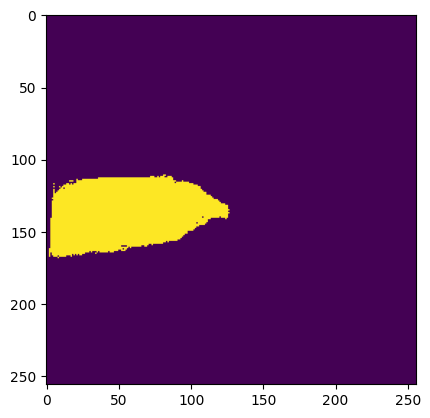

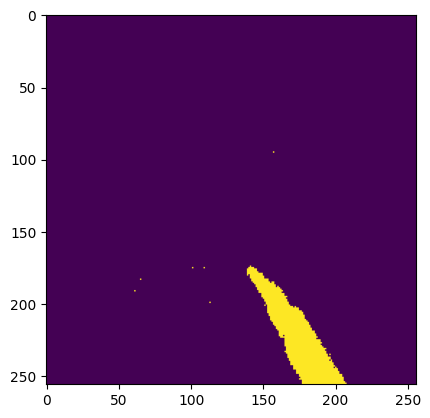

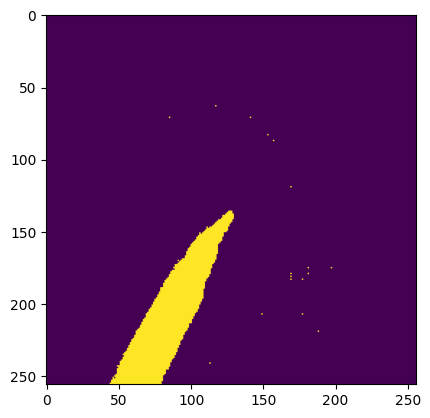

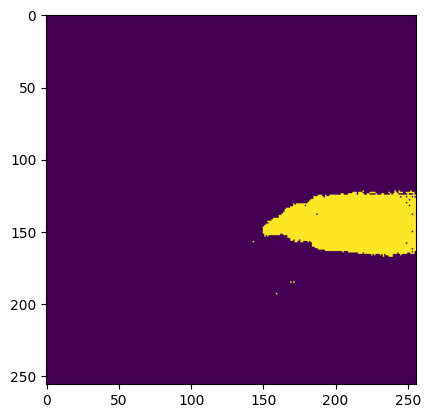

In [ ]:
import matplotlib.pyplot as plt
for frame in output[1]['multistep_pred_masks']:
    plt.imshow(frame[0].cpu().numpy()>0)
    plt.show()
    

In [ ]:
for o_idx in range(len(output)):
    for k in list(output[o_idx].keys()):
        if k not in ["multistep_pred_multimasks_high_res", "multistep_pred_ious", "multistep_object_score_logits"]:
            del output[o_idx][k]
        

criterion = MultiStepMultiMasksAndIous(weight_dict=weight_dict)
loss = criterion(output, targets)

In [ ]:
loss

defaultdict(int,
            {'loss_mask': tensor(0.0010, device='cuda:0'),
             'loss_dice': tensor(0.0653, device='cuda:0'),
             'loss_iou': tensor(0.0012, device='cuda:0'),
             'loss_class': tensor(0., device='cuda:0'),
             'core_loss': tensor(0.0868, device='cuda:0')})

In [ ]:
output[0]['multistep_pred_multimasks_high_res'][0].shape

torch.Size([4, 1, 1024, 1024])

In [ ]:
torch.stack([torch.unsqueeze(output[i]['multistep_pred_masks_high_res'].squeeze(), 0) for i in range(len(output))]).shape

torch.Size([4, 1, 4, 1024, 1024])

torch.Size([4, 1, 1024, 1024])
i--
j---


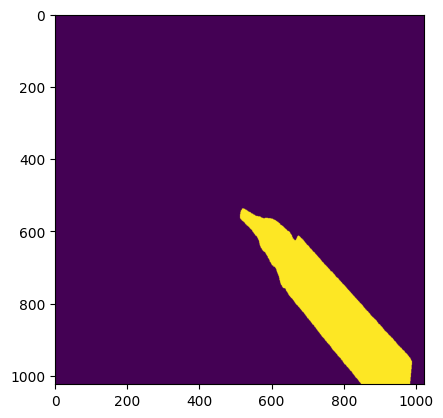

i--
j---


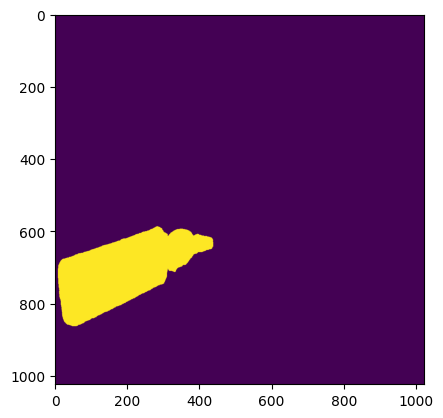

i--
j---


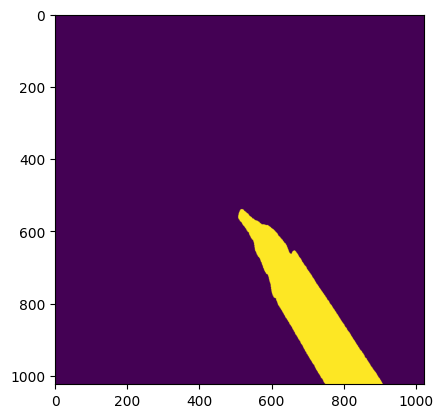

i--
j---


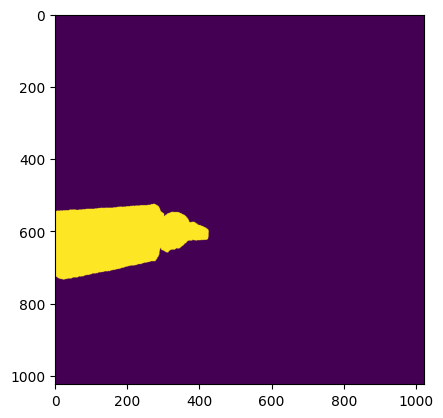

torch.Size([4, 3, 1024, 1024])
i--
j---


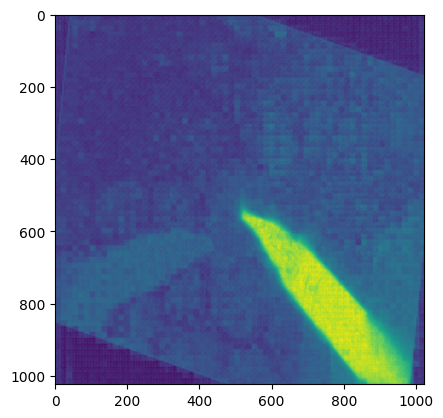

j---


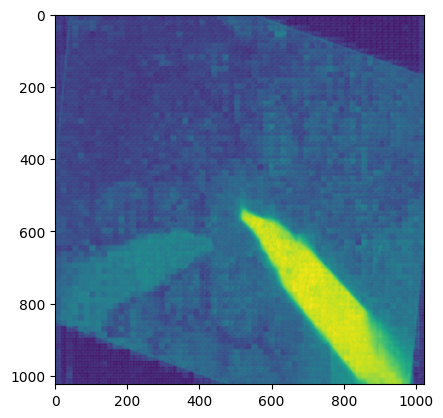

j---


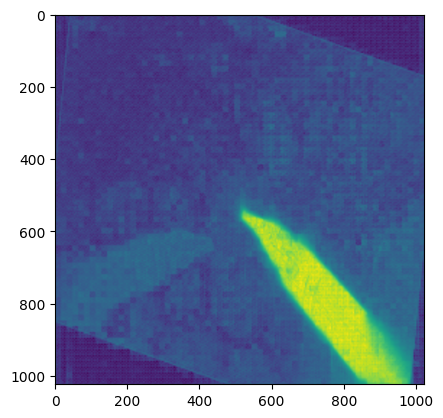

i--
j---


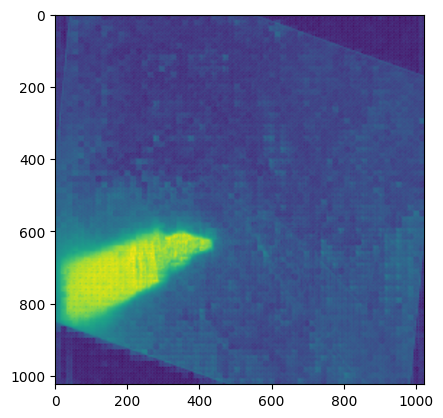

j---


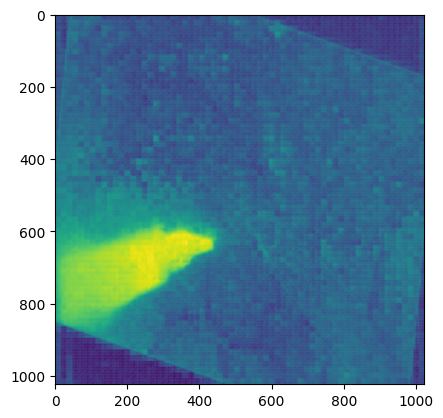

j---


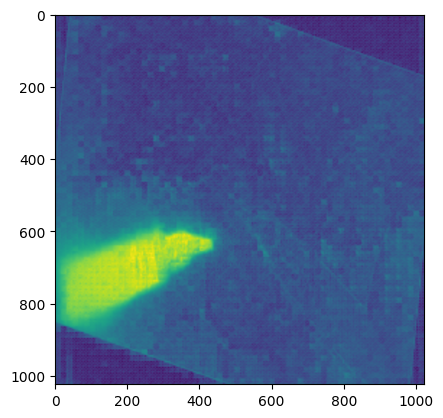

i--
j---


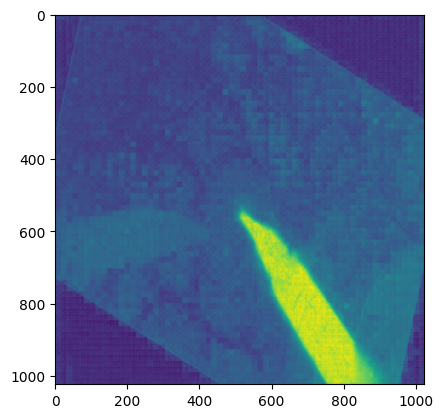

j---


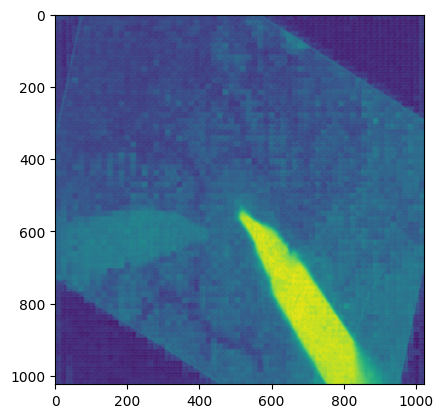

j---


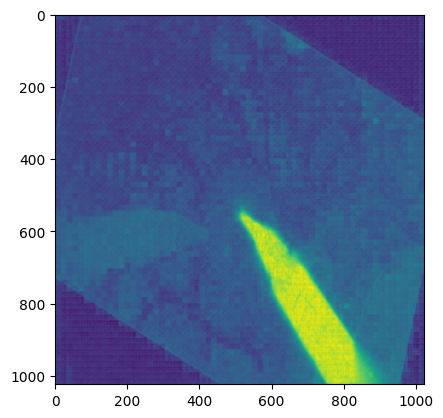

i--
j---


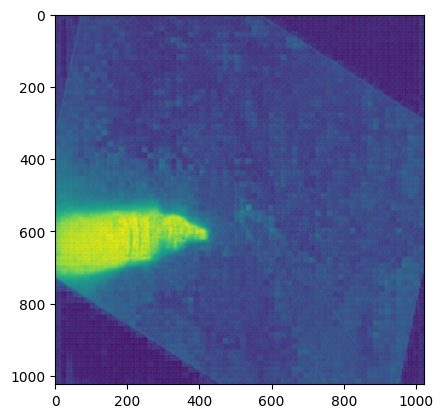

j---


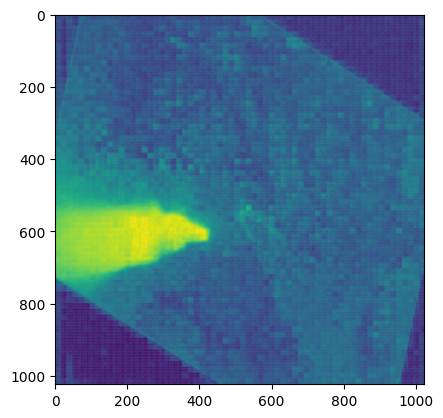

j---


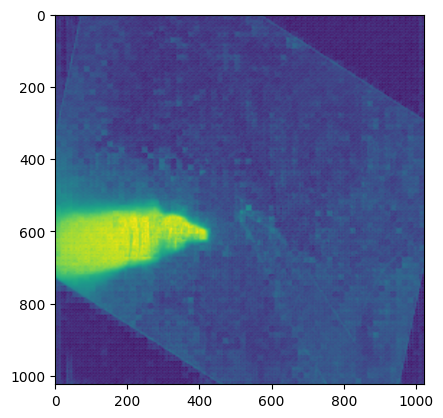

torch.Size([4, 3, 1024, 1024])
i--
j---


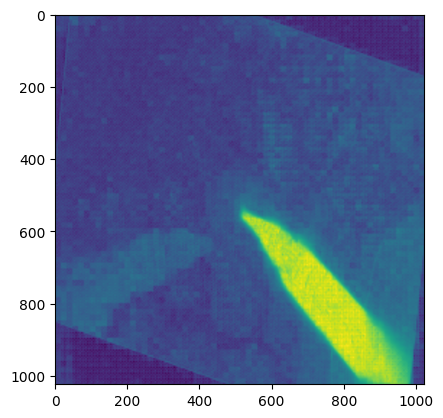

j---


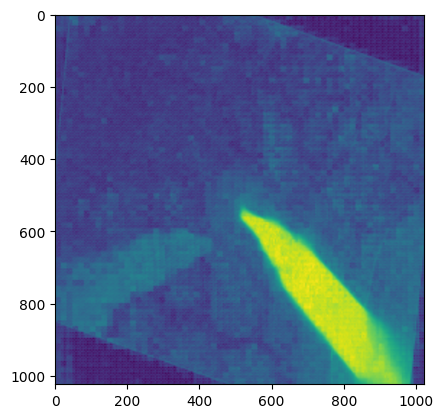

j---


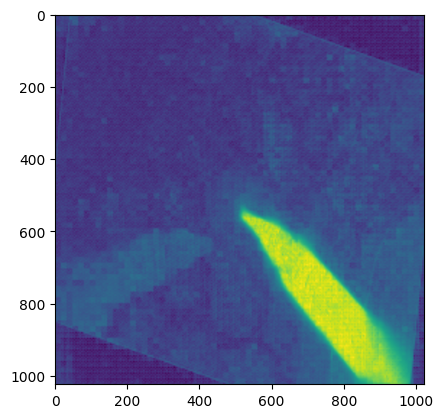

i--
j---


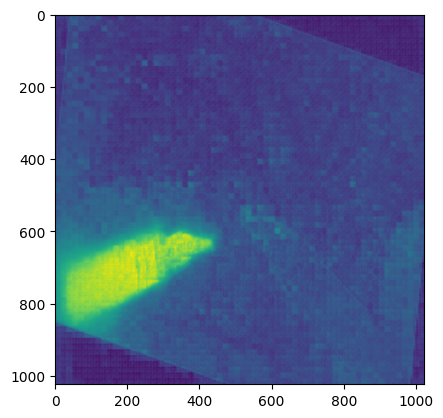

j---


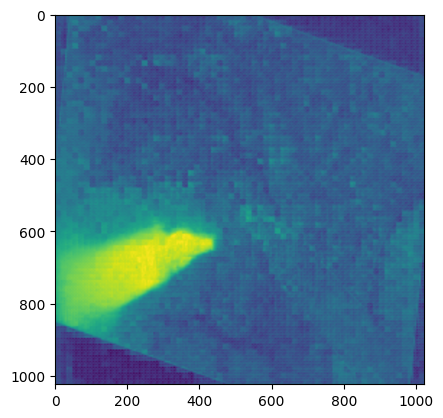

j---


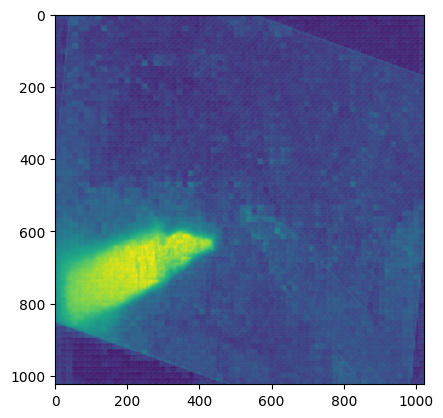

i--
j---


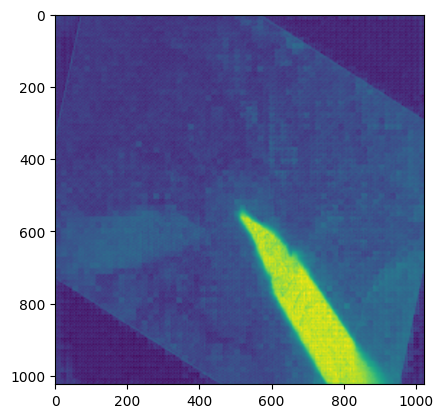

j---


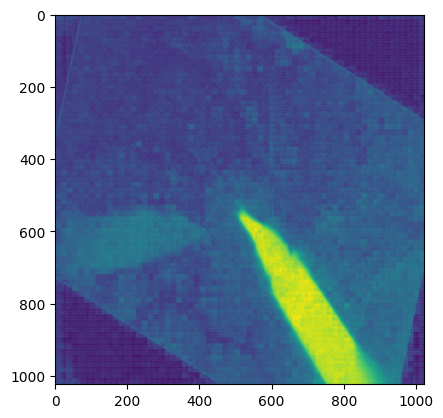

j---


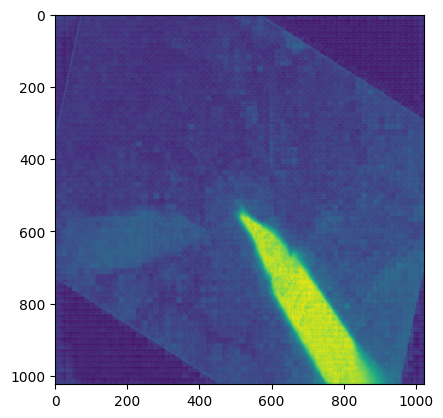

i--
j---


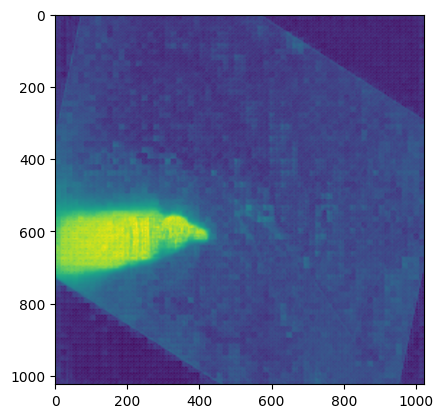

j---


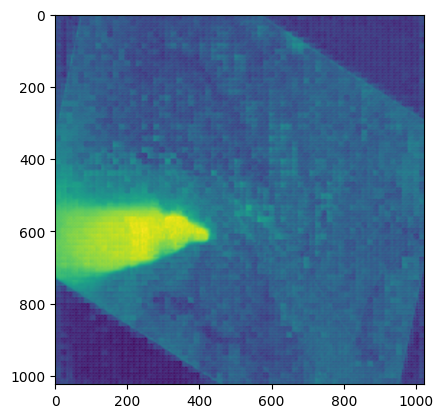

j---


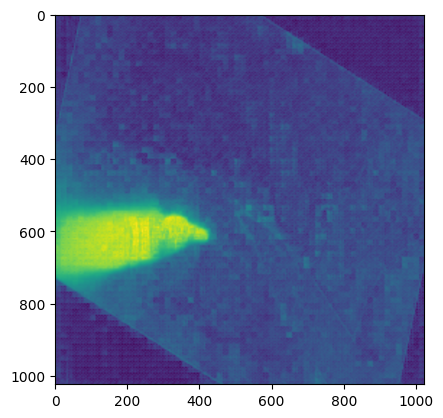

In [ ]:
for i in range(len(output)):
    print(output[i]['multistep_pred_multimasks_high_res'][0].shape)
    for i in output[i]['multistep_pred_multimasks_high_res'][0]:
        print("i--")
        for j in i:
            print("j---")
            plt.imshow(j.cpu().numpy())
            plt.show()

In [ ]:
targets.shape

torch.Size([3, 4, 1024, 1024])

In [ ]:
torch.stack([output[i]['multistep_pred_multimasks_high_res'].squeeze().unsqeeuze(0) for i in range(len(output))])

AttributeError: 'list' object has no attribute 'squeeze'

In [ ]:
len(output)

3

In [ ]:
output[0]['multistep_pred_multimasks_high_res']

[tensor([[[[-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           ...,
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.]]],
 
 
         [[[-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           ...,
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.]]],
 
 
         [[[-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
           ...,
           [-10., -10., -10.,  ..., -10., -10., -10.],
           [-10., -10., -10.,  ..., -10., -10., -10.],
     

In [ ]:
for i in output[0]:
    print([j.shape for j in output[0][i]])

[torch.Size([4, 1, 1024, 1024])]
[torch.Size([4, 1])]
[torch.Size([4, 1])]


In [ ]:
import os
import torch
from PIL import Image
from torchvision import transforms
from SAM2.sam2.sam2.build_sam import build_sam2_video_predictor

import numpy as np
import matplotlib.pyplot as plt
points = np.array([[210, 350]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)


predictor = model
predictor.training = False
# 5. Inference
with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # # Initialize with frames
    state = predictor.init_state("../segstrong/SegSTRONGC_test/test/9/0/smoke/left")
    
    # state = predictor.init_state("../test")


import matplotlib.pyplot as plt
import numpy as np
import cv2

from json import load
points = load(open("annotations/auto/test.json", "r"))
annot = points['data/raw/SegSTRONGC_test/test/9/0/smoke/left']
annot

img = cv2.imread("../segstrong/SegSTRONGC_test/test/9/0/smoke/left/10.png")[:, :, ::-1]
img = np.ascontiguousarray(img)

for i in annot['0']:
    print(i['x'], i['y'])
    img = cv2.circle(img, (i['x'], i['y']), 10, (0, 255, 0), -1)
    
for i in annot['1']:
    print(i['x'], i['y'])
    img = cv2.circle(img, (i['x'], i['y']), 10, (0, 0, 255), -1)
    
    
plt.imshow(img)
plt.show()


# 5. Inference
with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    # Initialize with frames
    # Apply prompt only on the first frame
    for obj in annot:
        obj_point = []
        for i in annot[obj]:
            obj_point.append([i['x'], i['y']])
        obj_point = np.array(obj_point, dtype=np.float32)

        #obj_point = np.array([[200, 300], [275, 175]], dtype=np.float32)
        _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=state,
    frame_idx=0,
    obj_id=int(obj),
    points=obj_point,
    labels=np.ones(obj_point.shape[0], dtype=np.int32),
)   
        print("State objects ids:", state['obj_ids'])
    

    # Optional: print first frame results
    print(f"First frame, object_ids={out_obj_ids}, logits min, max, mean {out_mask_logits.shape} = {out_mask_logits.min()}, {out_mask_logits.max()}, {out_mask_logits.mean()}")
    plt.imshow(out_mask_logits[0][0].cpu().numpy() > 0, cmap="gray")
    plt.show()
    # Propagate masks through video
    for frame_idx, object_ids, masks in predictor.propagate_in_video(state):
        print(f"Frame {frame_idx}: Got masks for object_ids {object_ids}")

        plt.imshow(cv2.imread(f"../segstrong/SegSTRONGC_test/test/9/0/smoke/left/{frame_idx}.png")[:, :, ::-1])
        mask = (masks[0] > 0) + (masks[1] > 0)
        plt.imshow(mask[0].cpu().numpy() > 0, cmap="gray", alpha=0.1)
        plt.show()
        if frame_idx==10:
            break
        # You can save or visualize the masks here

In [ ]:
import torch
from lora_qkv import wrap_image_encoder_lora, wrap_decoder_lora, save_lora_parameters, load_lora_parameters
wrap_decoder_lora(model, rank=8)
wrap_image_encoder_lora(model, rank=8)

torch.save(model.state_dict(), "model.pth")

In [ ]:
train_dict = torch.load("model.pth")    
for i in list(train_dict.keys()):
    # print(i)
    if '_a_q' in i or 'A_q' in i:
        print(i)

In [ ]:
model.image_encoder.trunk.blocks[22].attn.qkv ## 22, 23 

### save these parameters:

def save_lora_parameters(model, save_path):
    state_dict = model.state_dict()
    lora_param = {}
    for name, param in state_dict.items():
        if '_a_q' in name or 'A_q' in name or '_b_q' in name or 'B_q' in name:
            lora_param[name] = param
            
    torch.save(lora_param, save_path)
            
           
    
    
save_lora_parameters(model, "lora.pth")

def load_lora_parameters(model, load_path):
    error = model.load_state_dict(torch.load("lora.pth"), strict=False)
    for name in error.missing_keys:
        if '_a_q' in name or 'A_q' in name or '_b_q' in name or 'B_q' in name:
            raise ValueError(f"Custom LoRA Missing key in state_dict: {name}")

In [ ]:
from omegaconf import OmegaConf
from sam2_dataset import get_dataloader

config = OmegaConf.load("config.yaml")
config.distributed = False
train_loader, val_loader = get_dataloader("regular", config)

In [ ]:
img.shape

In [ ]:
import matplotlib.pyplot as plt
for data in train_loader:
    for mask, img in zip(data.masks[:2], data.img_batch[:2]):
        plt.imshow(img[0].permute(1, 2, 0).cpu().numpy())
        plt.show()
        plt.imshow(mask[0].cpu().numpy())
        plt.show()
        plt.imshow(mask[1].cpu().numpy())
        plt.show()

In [ ]:
data

In [ ]:
model.sam_mask_decoder.transformer.layers[0].self_attn.A_q #A_q, B_q, A_v, B_v



In [ ]:
def _load_checkpoint(model, ckpt_path):
    if ckpt_path is not None:
        sd = torch.load(ckpt_path, map_location="cuda", weights_only=True)["model"]
        missing_keys, unexpected_keys = model.load_state_dict(sd)
        if missing_keys:
            logging.error(missing_keys)
            raise RuntimeError()
        if unexpected_keys:
            logging.error(unexpected_keys)
            raise RuntimeError()
        logging.info("Loaded checkpoint sucessfully")


_load_checkpoint(model, "checkpoints/sam2.1_hiera_base_plus.pt")

In [ ]:
import os
import torch
from PIL import Image
from torchvision import transforms
from SAM2.sam2.sam2.build_sam import build_sam2_video_predictor

import numpy as np
import matplotlib.pyplot as plt
points = np.array([[210, 350]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)


# 4. Initialize model
checkpoint = "checkpoints/sam2.1_hiera_base_plus.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
predictor = build_sam2_video_predictor(model_cfg, checkpoint)

In [ ]:
wrap_image_encoder_lora(predictor, rank=8)
wrap_decoder_lora(predictor, rank=8)

In [ ]:
predictor.load_state_dict(torch.load("model.pth"), strict=True)

In [ ]:
model.sam_mask_decoder.transformer.layers[0].self_attn

In [ ]:
predictor

In [ ]:
def _load_checkpoint(model, ckpt_path):
    if ckpt_path is not None:
        sd = torch.load(ckpt_path, map_location="cuda", weights_only=True)["model"]
        missing_keys, unexpected_keys = model.load_state_dict(sd)
        if missing_keys:
            logging.error(missing_keys)
            raise RuntimeError()
        if unexpected_keys:
            logging.error(unexpected_keys)
            raise RuntimeError()
        logging.info("Loaded checkpoint sucessfully")


_load_checkpoint(model, "checkpoints/sam2.1_hiera_base_plus.pt")

In [ ]:
model.image_encoder.trunk.blocks[12:21]

In [ ]:
model.memory_attention.layers[0].cross_attn_image

# RoPEAttention

In [ ]:
import os
path = "/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train"
vids = []
for folder in os.listdir(path):
    for vid in os.listdir(os.path.join(path, folder)):
        vids.append(os.path.join(path, folder, vid))

/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/3/0
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/3/2
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/4/0
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/4/1
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/4/2
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/5/0
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/5/2
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/7/0
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/7/1
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/8/1
/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/8/2


In [ ]:
os.listdir('/media/frozenwolf/Seagate Backup Plus Drive/Segstrong/SegSTRONGC_train/3/0')

['ground_truth', 'regular']

In [ ]:
# import torch.nn.init as init
# import torch.nn as nn

# def init_weights(m):
#     if isinstance(m, nn.Linear):
#         init.kaiming_uniform_(m.weight)
#         if m.bias is not None:
#             init.zeros_(m.bias)
#     elif isinstance(m, nn.Conv2d):
#         init.xavier_normal_(m.weight)
#         if m.bias is not None:
#             init.zeros_(m.bias)
#     elif isinstance(m, nn.BatchNorm2d):
#         init.ones_(m.weight)
#         init.zeros_(m.bias)
#     # Add more layer types as needed

# # Assuming `model` is your existing nn.Module
# model.apply(init_weights)


In [ ]:
plt.imshow(output[0]['pred_masks'][0][0].cpu().numpy())

In [ ]:
plt.imshow(output[2]['pred_masks'][0][0].cpu().numpy())

In [ ]:
# model.image_encoder, model.memory_encoder, model.sam_mask_decoder, model.sam_prompt_encoder

In [ ]:
model

In [ ]:
model.image_encoder.trunk.blocks[-1]

In [ ]:
sum(p.numel() for p in model.image_encoder.trunk.blocks[-1:].parameters() if p.requires_grad)

In [ ]:

import importlib
import SAM2.sam2.training.utils.data_utils
importlib.reload(SAM2.sam2.training.utils.data_utils)
from SAM2.sam2.training.utils.data_utils import collate_fn

from torch.utils.data import DataLoader
## import partial and for collate use partial and set dict key as all:
from functools import partial


dataset = VOSDataset(transforms=train_transform, 
                     videos=test_set['blood'], 
                     gt_frames=test_gt)


train_loader = DataLoader(
    dataset,
    batch_size=2,
    shuffle=True,
    num_workers=0,
    collate_fn=partial(collate_fn, dict_key='all'),
    pin_memory=False,
)

batch = next(iter(train_loader))
batch = batch.to(
                "cuda"
            ) 




In [ ]:
model.training = True
with torch.no_grad():
    output = model(batch)
targets = batch.masks

In [ ]:


from SAM2.sam2.training.loss_fns import MultiStepMultiMasksAndIous


        
weight_dict = {'loss_mask': 20,
                'loss_dice': 1,
                'loss_iou': 1,
                'loss_class': 1}

criterion = MultiStepMultiMasksAndIous(weight_dict=weight_dict)
loss = criterion(output, targets)

In [ ]:
loss

In [ ]:
criterion = MultiStepMultiMasksAndIous(weight_dict=weight_dict, supervise_all_iou= True,
                                    iou_use_l1_loss = True,
                                    pred_obj_scores = True,
                                    focal_gamma_obj_score = 0.0,
                                    focal_alpha_obj_score= -1.0,)

loss = criterion(output, targets)
loss

In [ ]:
len(loss)

In [ ]:
loss_key, loss = loss.popitem()
loss_key, loss

In [ ]:
plt.imshow(output[0]['pred_masks_high_res'][0][0].cpu().numpy())
plt.show()

plt.imshow(output[0]['pred_masks_high_res'][1][0].cpu().numpy())
plt.show()

In [ ]:
'''
([torch.Size([6, 256, 256, 256]),
  torch.Size([6, 256, 128, 128]),
  torch.Size([6, 256, 64, 64])],
 [torch.Size([6, 32, 256, 256]),
  torch.Size([6, 64, 128, 128]),
  torch.Size([6, 256, 64, 64])])
'''

[i.shape for i in backbone_out['vision_pos_enc']], [i.shape for i in backbone_out['backbone_fpn']]

